In [30]:
import os
import datetime

import math
import IPython
import IPython.display
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
from scipy import stats
from datetime import datetime


mpl.rcParams['figure.figsize'] = (8, 6)
mpl.rcParams['axes.grid'] = False


In [31]:
df = pd.read_json('../data/raw_data.json')

df.head()

,feerate,fee,mempooldate,mempoolgrowthrate,networkdifficulty,averageconfirmationtime,mempoolsize,minerrevenue,totalhashrate,marketprice,dayofweek,hourofday,txid,hash,version,size,vsize,weight,locktime,conf
0,4.174089,1031,1642788827,1376.666667,2.437187e+13,12.179161,5423837.0,4.653528e+07,1.988644e+08,40684.42,12,12,0002968cb8cde878d9e91ec0cc625b95d5e301c02a3eed...,57e59282bbfc80f5d5c5f53b4b2b8373a271028e80d55c...,2,247,166,661,719791,NaN
1,3.865116,831,1642787656,1376.666667,2.437187e+13,12.179161,5423837.0,4.653528e+07,1.988644e+08,40684.42,12,12,0003e3a4a08be84b8dcb26e0b6af51bbb148e24e809e3e...,6d0c0a8f664939c7003a051400b09df36a03a60ab72291...,1,215,134,533,0,NaN
2,2.450893,549,1642787997,1376.666667,2.437187e+13,12.179161,5423837.0,4.653528e+07,1.988644e+08,40684.42,12,12,000a07f69e16fcdc1e88aa70e3d64936d22b728a380983...,64dc7ca312f5abc4e094d9329a3770ec0aba7aaaae92ec...,2,224,142,566,0,NaN
3,2.366071,795,1642785824,1376.666667,2.437187e+13,12.179161,5423837.0,4.653528e+07,1.988644e+08,40684.42,12,12,001ccb1bddb85b0ad7284a1c01767c4a405de3b3c87345...,5815cfcccf10040062bad3a86c1aae6603bef4fe3ede84...,1,336,146,582,719787,NaN
4,2.402299,1881,1642788035,1376.666667,2.437187e+13,12.179161,5423837.0,4.653528e+07,1.988644e+08,40684.42,12,12,002dd2cf977959583fb0a135a5e476be8e534b7f8dc6cc...,c0ad2a7ccffb7c49638acd2e0da73a1320555d469ccec3...,2,783,381,1521,719790,NaN


In [32]:
# Drop meta data fields 
df.drop('txid', axis=1, inplace=True)
df.drop('hash', axis=1, inplace=True)
df.drop('version', axis=1, inplace=True)
df.drop('locktime', axis=1, inplace=True)


In [33]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
feerate,425542.0,8.564869e+10,4.806830e+13,2.814452e-01,3.374663e+00,5.747059e+00,9.337838e+00,3.085453e+16
fee,425542.0,3.475458e+13,1.598476e+16,1.100000e+02,9.550000e+02,1.632000e+03,3.064000e+03,7.780232e+18
mempooldate,425542.0,1.641935e+09,4.286937e+06,1.631484e+09,1.643378e+09,1.643740e+09,1.643987e+09,1.644085e+09
mempoolgrowthrate,425542.0,1.297346e+03,3.589493e+02,6.800667e+02,1.091400e+03,1.251900e+03,1.371100e+03,3.047633e+03
networkdifficulty,425542.0,2.535102e+13,2.889714e+12,1.841516e+13,2.664319e+13,2.664319e+13,2.664319e+13,2.668470e+13
averageconfirmationtime,425542.0,1.920707e+01,8.068492e+00,9.303310e+00,1.232447e+01,1.993199e+01,2.470038e+01,4.653260e+01
mempoolsize,425542.0,9.806099e+06,1.068628e+07,2.090120e+05,1.969197e+06,5.194808e+06,1.271466e+07,3.594906e+07
minerrevenue,425542.0,3.614570e+07,4.332345e+06,3.022747e+07,3.411975e+07,3.467472e+07,3.686031e+07,4.946986e+07
totalhashrate,425542.0,1.833777e+08,2.020287e+07,1.327710e+08,1.880815e+08,1.905301e+08,1.948819e+08,1.988644e+08
marketprice,425542.0,3.877347e+04,3.079416e+03,3.667882e+04,3.709240e+04,3.714685e+04,3.852179e+04,4.707212e+04


In [34]:
## Keep in mind the label is mempool size, everything else is a potential feature

df.corr(method ='pearson')

,feerate,fee,mempooldate,mempoolgrowthrate,networkdifficulty,averageconfirmationtime,mempoolsize,minerrevenue,totalhashrate,marketprice,dayofweek,hourofday,size,vsize,weight,conf
feerate,1.000000,0.788103,0.000817,-0.000954,0.000797,0.001366,-0.001455,0.000294,0.000631,-0.001077,-0.000646,-0.001601,-0.000122,-0.000120,-0.000120,0.067396
fee,0.788103,1.000000,0.000994,-0.000799,0.000972,0.001666,-0.001818,0.000344,0.000769,-0.001313,-0.000786,-0.002403,0.000118,-0.000009,-0.000008,0.023961
mempooldate,0.000817,0.000994,1.000000,0.193247,0.991877,0.310878,0.296874,-0.662338,0.991688,-0.957275,-0.738002,0.063414,0.009489,0.008820,0.008816,0.996846
mempoolgrowthrate,-0.000954,-0.000799,0.193247,1.000000,0.193841,-0.101251,0.011364,-0.129237,0.188689,-0.197139,-0.238457,-0.299470,0.003677,0.004899,0.004899,0.061634
networkdifficulty,0.000797,0.000972,0.991877,0.193841,1.000000,0.352728,0.280525,-0.739750,0.969516,-0.976433,-0.781575,0.064312,0.010120,0.009205,0.009201,NaN
averageconfirmationtime,0.001366,0.001666,0.310878,-0.101251,0.352728,1.000000,-0.458493,-0.310662,0.235295,-0.317246,-0.315974,0.318573,0.008054,0.004141,0.004140,0.095694
mempoolsize,-0.001455,-0.001818,0.296874,0.011364,0.280525,-0.458493,1.000000,-0.204982,0.345114,-0.297344,-0.185098,0.197538,-0.007166,-0.005144,-0.005145,-0.040535
minerrevenue,0.000294,0.000344,-0.662338,-0.129237,-0.739750,-0.310662,-0.204982,1.000000,-0.595524,0.780059,0.674101,0.016249,-0.008767,-0.007916,-0.007913,0.711369
totalhashrate,0.000631,0.000769,0.991688,0.188689,0.969516,0.235295,0.345114,-0.595524,1.000000,-0.927242,-0.686670,0.062836,0.008492,0.008254,0.008250,-0.629088
marketprice,-0.001077,-0.001313,-0.957275,-0.197139,-0.976433,-0.317246,-0.297344,0.780059,-0.927242,1.000000,0.748702,-0.020941,-0.009114,-0.008043,-0.008040,0.773499


In [35]:
## Split data
column_indices = {name: i for i, name in enumerate(df.columns)}

n = len(df)
train_df = df[0:int(n*0.7)]
val_df = df[int(n*0.7):int(n*0.9)]
test_df = df[int(n*0.9):]

num_features = df.shape[1]

<AxesSubplot:xlabel='mempooldate'>

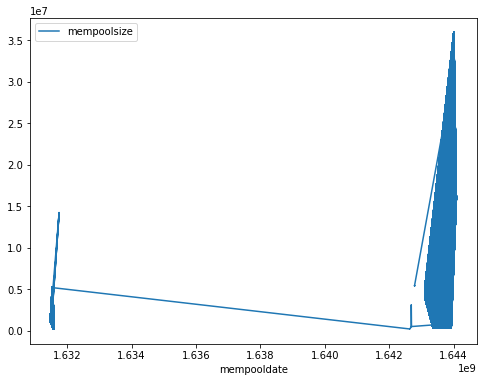

In [36]:
# plot the label 
df.plot(x = 'mempooldate', y = 'mempoolsize', kind = 'line')

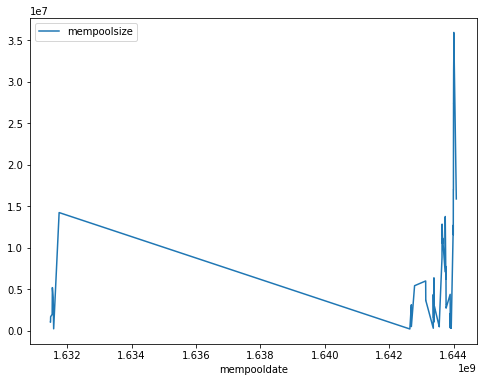

In [37]:
df.sort_values(by = 'mempooldate').plot(x = 'mempooldate', y = 'mempoolsize', kind = 'line')

df = df.sort_values(by = 'mempooldate')

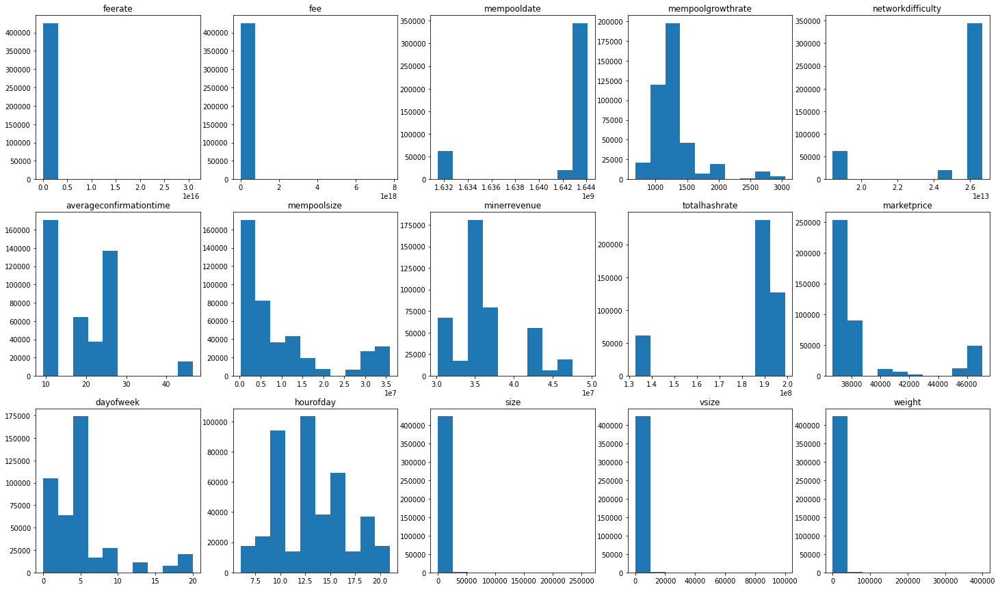

In [38]:
## Taking a look at all the distrabutions

fig, ax = plt.subplots(3, 5, figsize = (25, 15))
count = 0
for i in range(3):
  for j in range(5):
    ax[i, j].hist(df[df.columns[count]])
    ax[i, j].set_title(df.columns[count])
    
    count+=1

In [18]:
sns.pairplot(df)

MemoryError: Unable to allocate 1.35 EiB for an array with shape (194592263380094720,) and data type float64

In [21]:
df.drop(columns = 'networkdifficulty', inplace=True)

In [26]:
def as_date(ts):
  return(datetime.fromtimestamp(ts).strftime('%Y-%m-%d %H:%M:%S'))

df.mempooldate = pd.to_datetime(df.mempooldate.apply(as_date))




TypeError: an integer is required (got type Timestamp)

In [27]:
df.set_index('mempooldate', drop = True, inplace=True)

In [ ]:
# group by each unique timestamp
df = df.reset_index().groupby('mempooldate').mean()

In [29]:
# resample to 15 sec intervals and foward fill when NA;s get created
df = df.resample('15S').pad().iloc[1:,:]

ValueError: cannot reindex a non-unique index with a method or limit

In [41]:
## Normalize the dataset with min / max
train_mean = train_df.mean()
train_std = train_df.std()

train_df = (train_df - train_mean) / train_std
val_df = (val_df - train_mean) / train_std
test_df = (test_df - train_mean) / train_std

train_df.head()

,feerate,fee,mempooldate,mempoolgrowthrate,networkdifficulty,averageconfirmationtime,mempoolsize,minerrevenue,totalhashrate,marketprice,dayofweek,hourofday,size,vsize,weight,conf
0,-0.281053,-0.090495,-2.908742,0.133591,-5.069559,-1.052115,-0.512341,3.652249,2.438722,3.644601,3.872333,-0.309542,-0.105910,-0.106636,-0.106735,NaN
1,-0.293351,-0.094321,-2.912439,0.133591,-5.069559,-1.052115,-0.512341,3.652249,2.438722,3.644601,3.872333,-0.309542,-0.113165,-0.117287,-0.117386,NaN
2,-0.349643,-0.099715,-2.911362,0.133591,-5.069559,-1.052115,-0.512341,3.652249,2.438722,3.644601,3.872333,-0.309542,-0.111125,-0.114624,-0.114640,NaN
3,-0.353019,-0.095009,-2.918224,0.133591,-5.069559,-1.052115,-0.512341,3.652249,2.438722,3.644601,3.872333,-0.309542,-0.085732,-0.113293,-0.113309,NaN
4,-0.351577,-0.074237,-2.911242,0.133591,-5.069559,-1.052115,-0.512341,3.652249,2.438722,3.644601,3.872333,-0.309542,0.015610,-0.035070,-0.035169,NaN


In [42]:
# Remove outliers


df = df[(np.abs(stats.zscore(df['fee'])) < 3)]
df.describe().transpose()


,count,mean,std,min,25%,50%,75%,max
feerate,424082.0,1.094602e+01,2.326765e+01,2.814452e-01,3.372661e+00,5.743590e+00,9.321429e+00,6.517857e+02
fee,424082.0,4.205477e+03,1.007786e+04,1.100000e+02,9.500000e+02,1.629000e+03,3.034000e+03,1.531380e+05
mempooldate,424082.0,1.641936e+09,4.286482e+06,1.631484e+09,1.643378e+09,1.643740e+09,1.643987e+09,1.644085e+09
mempoolgrowthrate,424082.0,1.297211e+03,3.588309e+02,6.800667e+02,1.091400e+03,1.251900e+03,1.371100e+03,3.047633e+03
networkdifficulty,424082.0,2.535129e+13,2.889430e+12,1.841516e+13,2.664319e+13,2.664319e+13,2.664319e+13,2.668470e+13
averageconfirmationtime,424082.0,1.921145e+01,8.070872e+00,9.303310e+00,1.232447e+01,1.993199e+01,2.470038e+01,4.653260e+01
mempoolsize,424082.0,9.801718e+06,1.068599e+07,2.090120e+05,1.969197e+06,5.194808e+06,1.271466e+07,3.594906e+07
minerrevenue,424082.0,3.614569e+07,4.332625e+06,3.022747e+07,3.411975e+07,3.467472e+07,3.686031e+07,4.946986e+07
totalhashrate,424082.0,1.833784e+08,2.020039e+07,1.327710e+08,1.880815e+08,1.905301e+08,1.948819e+08,1.988644e+08
marketprice,424082.0,3.877280e+04,3.079205e+03,3.667882e+04,3.709240e+04,3.714685e+04,3.852179e+04,4.707212e+04


In [44]:
tx_with_conf = df[df.conf.notnull()]

tx_with_conf.head()
print(f"{len(tx_with_conf)} of txs have confirmation times out of {len(df)}")


46153 of txs have confirmation times out of 424082


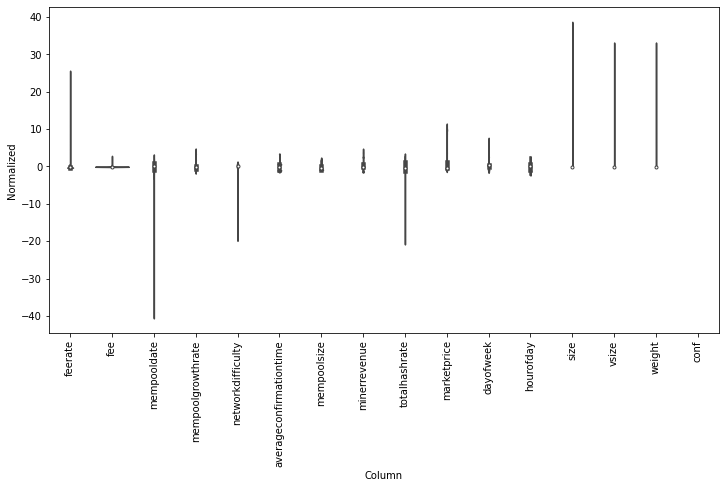

In [46]:
df_std = (df - train_mean) / train_std
df_std = df_std.melt(var_name='Column', value_name='Normalized')
plt.figure(figsize=(12, 6))
ax = sns.violinplot(x='Column', y='Normalized', data=df_std)
_ = ax.set_xticklabels(df.keys(), rotation=90)

In [69]:
class WindowGenerator():
  def __init__(self, input_width, label_width, shift,
               train_df=train_df, val_df=val_df, test_df=test_df,
               label_columns=None):
    # Store the raw data.
    self.train_df = train_df
    self.val_df = val_df
    self.test_df = test_df

    # Work out the label column indices.
    self.label_columns = label_columns
    if label_columns is not None:
      self.label_columns_indices = {name: i for i, name in
                                    enumerate(label_columns)}
    self.column_indices = {name: i for i, name in
                           enumerate(train_df.columns)}

    # Work out the window parameters.
    self.input_width = input_width
    self.label_width = label_width
    self.shift = shift

    self.total_window_size = input_width + shift

    self.input_slice = slice(0, input_width)
    self.input_indices = np.arange(self.total_window_size)[self.input_slice]

    self.label_start = self.total_window_size - self.label_width
    self.labels_slice = slice(self.label_start, None)
    self.label_indices = np.arange(self.total_window_size)[self.labels_slice]

  def __repr__(self):
    return '\n'.join([
        f'Total window size: {self.total_window_size}',
        f'Input indices: {self.input_indices}',
        f'Label indices: {self.label_indices}',
        f'Label column name(s): {self.label_columns}'])

In [13]:
## Test the window generator
w1 = WindowGenerator(input_width=24, label_width=1, shift=24, label_columns=['mempoolsize'])

print(w1)

Total window size: 48
Input indices: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
Label indices: [47]
Label column name(s): ['mempoolsize']


In [71]:
def split_window(self, features):
  inputs = features[:, self.input_slice, :]
  labels = features[:, self.labels_slice, :]
  if self.label_columns is not None:
    labels = tf.stack(
        [labels[:, :, self.column_indices[name]] for name in self.label_columns],
        axis=-1)

  # Slicing doesn't preserve static shape information, so set the shapes
  # manually. This way the `tf.data.Datasets` are easier to inspect.
  inputs.set_shape([None, self.input_width, None])
  labels.set_shape([None, self.label_width, None])

  return inputs, labels

WindowGenerator.split_window = split_window

In [85]:
w2 = WindowGenerator(input_width=5000, label_width=1, shift=1,
                     label_columns=['mempoolsize'])
w2

Total window size: 5001
Input indices: [   0    1    2 ... 4997 4998 4999]
Label indices: [5000]
Label column name(s): ['mempoolsize']

In [86]:
# Stack three slices, the length of the total window.
example_window = tf.stack([np.array(train_df[:w2.total_window_size]),
                           np.array(train_df[100:100+w2.total_window_size]),
                           np.array(train_df[200:200+w2.total_window_size])])

example_inputs, example_labels = w2.split_window(example_window)

print('All shapes are: (batch, time, features)')
print(f'Window shape: {example_window.shape}')
print(f'Inputs shape: {example_inputs.shape}')
print(f'Labels shape: {example_labels.shape}')

All shapes are: (batch, time, features)
Window shape: (3, 5001, 16)
Inputs shape: (3, 5000, 16)
Labels shape: (3, 1, 1)


In [90]:
w2.example = example_inputs, example_labels

In [91]:
def plot(self, model=None, plot_col='mempoolsize', max_subplots=3):
  inputs, labels = self.example
  plt.figure(figsize=(12, 8))
  plot_col_index = self.column_indices[plot_col]
  max_n = min(max_subplots, len(inputs))
  for n in range(max_n):
    plt.subplot(max_n, 1, n+1)
    plt.ylabel(f'{plot_col} [normed]')
    plt.plot(self.input_indices, inputs[n, :, plot_col_index],
             label='Inputs', marker='.', zorder=-10)

    if self.label_columns:
      label_col_index = self.label_columns_indices.get(plot_col, None)
    else:
      label_col_index = plot_col_index

    if label_col_index is None:
      continue

    plt.scatter(self.label_indices, labels[n, :, label_col_index],
                edgecolors='k', label='Labels', c='#2ca02c', s=64)
    if model is not None:
      predictions = model(inputs)
      plt.scatter(self.label_indices, predictions[n, :, label_col_index],
                  marker='X', edgecolors='k', label='Predictions',
                  c='#ff7f0e', s=64)

    if n == 0:
      plt.legend()

  plt.xlabel('Time [h]')

WindowGenerator.plot = plot

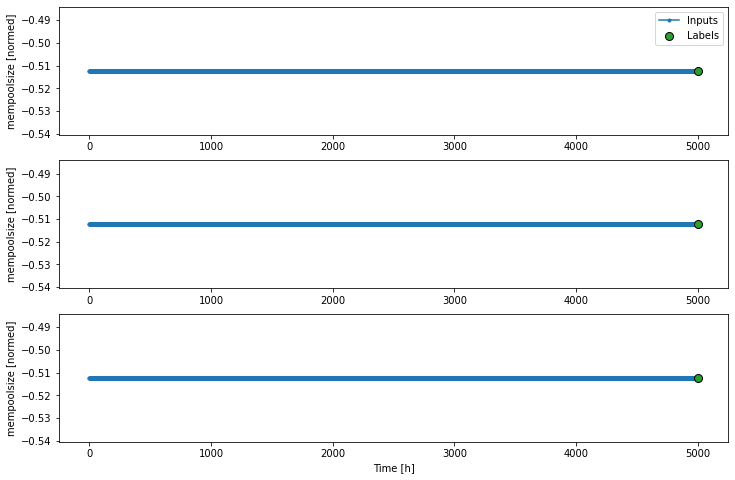

In [92]:
w2.plot()

In [93]:
def make_dataset(self, data):
  data = np.array(data, dtype=np.float32)
  ds = tf.keras.preprocessing.timeseries_dataset_from_array(
      data=data,
      targets=None,
      sequence_length=self.total_window_size,
      sequence_stride=1,
      shuffle=True,
      batch_size=32,)

  ds = ds.map(self.split_window)

  return ds

WindowGenerator.make_dataset = make_dataset

In [94]:
@property
def train(self):
  return self.make_dataset(self.train_df)

@property
def val(self):
  return self.make_dataset(self.val_df)

@property
def test(self):
  return self.make_dataset(self.test_df)

@property
def example(self):
  """Get and cache an example batch of `inputs, labels` for plotting."""
  result = getattr(self, '_example', None)
  if result is None:
    # No example batch was found, so get one from the `.train` dataset
    result = next(iter(self.train))
    # And cache it for next time
    self._example = result
  return result

WindowGenerator.train = train
WindowGenerator.val = val
WindowGenerator.test = test
WindowGenerator.example = example

In [95]:
w1.train.element_spec

(TensorSpec(shape=(None, 24, 16), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 1, 1), dtype=tf.float32, name=None))

In [96]:
for example_inputs, example_labels in w1.train.take(1):
  print(f'Inputs shape (batch, time, features): {example_inputs.shape}')
  print(f'Labels shape (batch, time, features): {example_labels.shape}')

Inputs shape (batch, time, features): (32, 24, 16)
Labels shape (batch, time, features): (32, 1, 1)


In [97]:
single_step_window = WindowGenerator(
    input_width=1, label_width=1, shift=1,
    label_columns=['mempoolsize'])
single_step_window

Total window size: 2
Input indices: [0]
Label indices: [1]
Label column name(s): ['mempoolsize']

In [98]:
for example_inputs, example_labels in single_step_window.train.take(1):
  print(f'Inputs shape (batch, time, features): {example_inputs.shape}')
  print(f'Labels shape (batch, time, features): {example_labels.shape}')

Inputs shape (batch, time, features): (32, 1, 16)
Labels shape (batch, time, features): (32, 1, 1)


In [99]:
class Baseline(tf.keras.Model):
  def __init__(self, label_index=None):
    super().__init__()
    self.label_index = label_index

  def call(self, inputs):
    if self.label_index is None:
      return inputs
    result = inputs[:, :, self.label_index]
    return result[:, :, tf.newaxis]

baseline = Baseline(label_index=column_indices['mempoolsize'])

baseline.compile(loss=tf.losses.MeanSquaredError(),
                 metrics=[tf.metrics.MeanAbsoluteError()])

val_performance = {}
performance = {}
val_performance['Baseline'] = baseline.evaluate(single_step_window.val)
performance['Baseline'] = baseline.evaluate(single_step_window.test, verbose=0)

2660/2660 [==============================] - 5s 2ms/step - loss: 1.4284 - mean_absolute_error: 0.7839


In [102]:
wide_window = WindowGenerator(
    input_width=240, label_width=240, shift=1,
    label_columns=['mempoolsize'])

print(wide_window)
print('Input shape:', wide_window.example[0].shape)
print('Output shape:', baseline(wide_window.example[0]).shape)


Total window size: 241
Input indices: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 

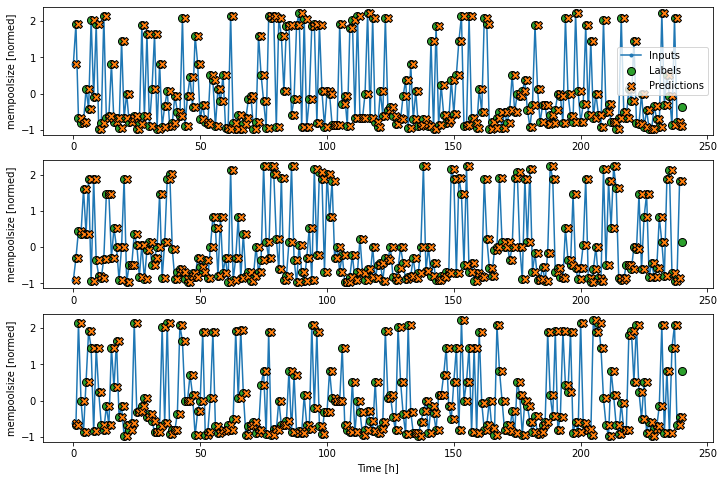

In [103]:
wide_window.plot(baseline)

In [104]:
linear = tf.keras.Sequential([
    tf.keras.layers.Dense(units=1)
])
print('Input shape:', single_step_window.example[0].shape)
print('Output shape:', linear(single_step_window.example[0]).shape)

print(linear.summary())

Input shape: (32, 1, 16)
Output shape: (32, 1, 1)
Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_11 (Dense)            (32, 1, 1)                17        
                                                                 
Total params: 17
Trainable params: 17
Non-trainable params: 0
_________________________________________________________________
None


In [105]:
MAX_EPOCHS = 20

def compile_and_fit(model, window, patience=2):
  early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                    patience=patience,
                                                    mode='min')

  model.compile(loss=tf.losses.MeanSquaredError(),
                optimizer=tf.optimizers.Adam(),
                metrics=[tf.metrics.MeanAbsoluteError()])

  history = model.fit(window.train, epochs=MAX_EPOCHS,
                      validation_data=window.val,
                      callbacks=[early_stopping])
  return history

In [66]:
history = compile_and_fit(linear, wide_window)

val_performance['Linear'] = linear.evaluate(single_step_window.val)
performance['Linear'] = linear.evaluate(single_step_window.test, verbose=0)



Epoch 1/20
9308/9308 [==============================] - 65s 7ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 2/20
9308/9308 [==============================] - 66s 7ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 3/20
3407/9308 [=========>....................] - ETA: 35s - loss: nan - mean_absolute_error: nan

KeyboardInterrupt: 

In [ ]:
print(val_performance, performance)

single_step_window.plot(linear)

In [29]:
## Dense single input step models

dense = tf.keras.Sequential([
    tf.keras.layers.Dense(units=64, activation='relu'),
    tf.keras.layers.Dense(units=64, activation='relu'),
    tf.keras.layers.Dense(units=1)
])

history = compile_and_fit(dense, single_step_window)

val_performance['Dense'] = dense.evaluate(single_step_window.val)
performance['Dense'] = dense.evaluate(single_step_window.test, verbose=0)

Epoch 1/20
9309/9309 [==============================] - 21s 2ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 2/20
9309/9309 [==============================] - 28s 3ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 3/20
9309/9309 [==============================] - 22s 2ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 4/20
2660/2660 [==============================] - 4s 2ms/step - loss: nan - mean_absolute_error: nan


{'Baseline': [1.4284400939941406, 0.7839412689208984], 'Linear': [nan, nan], 'Dense': [nan, nan]} {'Baseline': [0.05191384255886078, 0.17734016478061676], 'Linear': [nan, nan], 'Dense': [nan, nan]}


In [1]:
#RNNs

lstm_model = tf.keras.models.Sequential([
    # Shape [batch, time, features] => [batch, time, lstm_units]
    tf.keras.layers.LSTM(32, return_sequences=True),
    # Shape => [batch, time, features]
    tf.keras.layers.Dense(units=1)
])

history = compile_and_fit(lstm_model, wide_window)

IPython.display.clear_output()
val_performance['LSTM'] = lstm_model.evaluate(wide_window.val)
performance['LSTM'] = lstm_model.evaluate(wide_window.test, verbose=0)

NameError: name 'tf' is not defined

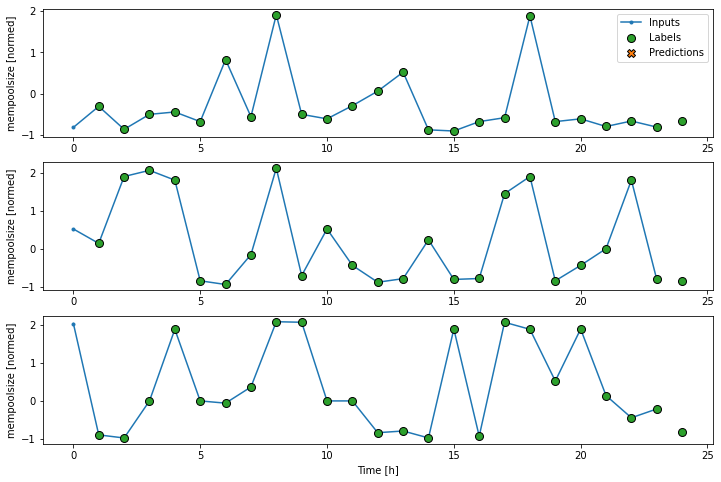

In [73]:
wide_window.plot(lstm_model)



In [74]:
print(val_performance, performance)

{'Baseline': [1.4284400939941406, 0.7839412689208984], 'Linear': [nan, nan], 'Dense': [nan, nan], 'LSTM': [nan, nan]} {'Baseline': [0.05191384255886078, 0.17734016478061676], 'Linear': [nan, nan], 'Dense': [nan, nan], 'LSTM': [nan, nan]}
